In [8]:
!export CUDA_VISIBLE_DEVICES=0

import torch
import numpy as np 

import matplotlib.pyplot as plt

from copy import deepcopy
from plotly.offline import init_notebook_mode

from vae_dist.dataset.dataset import FieldDataset
from vae_dist.data.visualize import get_latent_space
from vae_dist.core.training_utils import construct_model 
from vae_dist.dataset.fields import split_and_filter
import json 

init_notebook_mode(connected=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_vfield(mat, cutoff_low = 95, cutoff_high = 99.999, min_max = True, scale = 10):
        # mat has shape (1, 3, 21, 21, 21)
        x = mat 
        print(x.min(), x.max())
        u_1, v_1, w_1 = split_and_filter(x, 
                                         cutoff_low_percentile = cutoff_low, 
                                         cutoff_high_percentile = cutoff_high)  
        a, b, c = np.meshgrid(
                np.arange(-3, 3.3, 0.3),
                np.arange(-3, 3.3, 0.3),
                np.arange(-3, 3.3, 0.3)
                )
        
        #max value of each dimension
        max_u = np.max(u_1)
        max_v = np.max(v_1)
        max_w = np.max(w_1)

        #print(max_u, max_v, max_w)
        #print(a.shape, b.shape, c.shape, u_1.shape, v_1.shape, w_1.shape)
        cones = go.Cone(
                x=a.flatten(), 
                y=b.flatten(), 
                z=c.flatten(), 
                u=u_1 ,
                v=v_1 , 
                w=w_1 ,
                sizeref=scale)
                
        components = {"u": u_1, "v": v_1, "w": w_1}
        return cones, components

In [10]:
model_list = []
model_names = "model_single_datapoint.ckpt"

for model_type in ['cnn']:
    options = json.load(open('./options/options_{}_default.json'.format(model_type)))
    model_temp = construct_model(model_type, options)
    model_temp.load_model("./log_version_{}_1/{}".format(model_type, model_names))
    model_temp.to(device)
    model_list.append(deepcopy(model_temp))

inner_dim:  3
channel_in:  3
channel_out:  32
kernel:  4
stride:  1
channel_in:  32
channel_out:  64
kernel:  3
stride:  1
channel_in:  64
channel_out:  128
kernel:  3
stride:  1
channel_in:  128
channel_out:  256
kernel:  3
stride:  1
channel_in:  256
channel_out:  512
kernel:  3
stride:  1
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv3d-1       [-1, 32, 18, 18, 18]           6,176
       BatchNorm3d-2       [-1, 32, 18, 18, 18]              64
         LeakyReLU-3       [-1, 32, 18, 18, 18]               0
         ConvBatch-4       [-1, 32, 18, 18, 18]               0
            Conv3d-5       [-1, 64, 16, 16, 16]          55,360
       BatchNorm3d-6       [-1, 64, 16, 16, 16]             128
         LeakyReLU-7       [-1, 64, 16, 16, 16]               0
         ConvBatch-8       [-1, 64, 16, 16, 16]               0
            Conv3d-9      [-1, 128, 14, 14, 14]         221,312
  

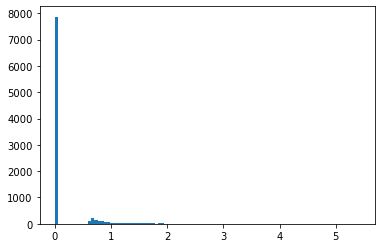

Data shape:  (1, 3, 21, 21, 21)
Data type:  float64
------------------------- Preprocessing Info -------------------------
Helmholtz-Hodge decomposition applied:  False
Lower filter applied:  True
Log scale applied:  True
Standardization applied:  False
Min max scaling applied:  False
Wrangling outliers applied:  False
------------------------- Data Info -------------------------
Mean value in dataset:  -0.0058118273764532265
Standard deviation in dataset:  0.27259401993158766
Largest value in dataset:  4.13
Smallest value in dataset:  -5.42
Nan values in dataset:  False
Inf values in dataset:  False


In [11]:
root = '../../data/single_field/'

dataset_single = FieldDataset(
        root, 
        transform=False, 
        augmentation=False,
        standardize=False,
        lower_filter=True,
        log_scale=True, 
        min_max_scale=False,
        wrangle_outliers=False,
        scalar=False,
        show=True,
        device=device
    )

dataset_loader_full = torch.utils.data.DataLoader(
                dataset_single, 
                batch_size=1,
                shuffle=True,
                num_workers=0
            )

Aug
Total number of fields:  1


IndexError: index 1 is out of bounds for axis 1 with size 1

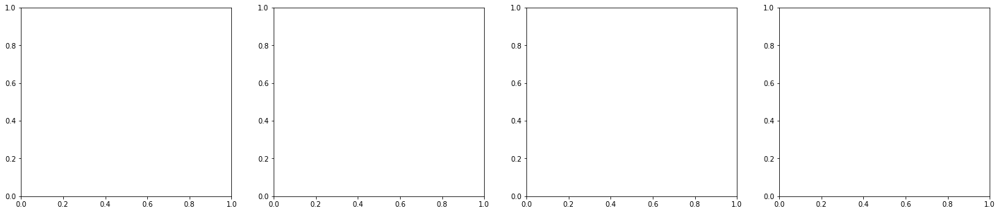

In [12]:
def mean_distance(latent_space):
    mean_dist = 0
    for i in range(latent_space.shape[0]):
        for j in range(latent_space.shape[0]):
            mean_dist += np.linalg.norm(latent_space[i] - latent_space[j])
    mean_dist /= latent_space.shape[0]**2
    return mean_dist


fig, axs = plt.subplots(1, 4, figsize=(25, 5))
# iterate over the sub plots
for i, ax in enumerate(axs.flatten()):
    # plot the data
    print("Aug")
    latent_space_aug = get_latent_space(model_list[i], dataset_single, comp=[0, 1], latent_dim=1)
    mean_aug = mean_distance(latent_space_aug)

    ax.scatter(
        latent_space_aug[:, 0], 
        latent_space_aug[:, 1], c="red", 
        label="aug, mean dist: {:.6f}".format(mean_aug))

    # legend bottom right
    ax.legend(loc="lower right")
    ax.set_title(f"Model {i+1}")

In [39]:
dataset_single[0].shape

torch.Size([3, 21, 21, 21])

In [13]:
def show_in_out_plots(in_field, model):
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'cone'}, {'type': 'cone'}]])

    model = model_list[0]
    x = in_field.reshape(1, 3, 21, 21, 21).to(device)
    x_out = model.forward(x)
    x_out = x_out.to('cpu').detach().numpy().reshape(1, 3, 21, 21, 21)

    field_in, comp_in  = plot_vfield(
            x.cpu().numpy(), 
            cutoff_low = 85, 
            cutoff_high=100, 
            min_max = False,
            scale = 2)
    field_out, comp_out = plot_vfield(
            x_out, 
            cutoff_low = 85, 
            cutoff_high=100, 
            min_max = False,
            scale = 2)

    # add field_in to the first subplot
    fig.add_trace(field_in , row=1, col=1)
    # add field_out to the second subplot
    fig.add_trace(field_out, row=1, col=2)

    fig.update_layout(
            scene = dict(
                xaxis = dict(nticks=10, range=[-3,3],),
                yaxis = dict(nticks=10, range=[-3,3],),
                zaxis = dict(nticks=10, range=[-3,3],)),
            scene2 = dict(
                xaxis = dict(nticks=10, range=[-3,3],),
                yaxis = dict(nticks=10, range=[-3,3],),
                zaxis = dict(nticks=10, range=[-3,3],)),
            title='Slices in volumetric data',
            width=1000, height=600)

    fig.show()
    return comp_in, comp_out
# this is raw field data
test_field = dataset_single.dataraw[0].reshape(1, 3, 21, 21, 21)
# this is the field data after the preprocessing
test_field = dataset_single[0].reshape(1, 3, 21, 21, 21)
#make test field  a tensor
test_field = test_field.clone().detach()
test_field = test_field.to(device, dtype=torch.float)
comp_in, comp_out = show_in_out_plots(test_field, model_list[0])


-5.42 4.13
-10.529278 9.759858


In [14]:
# compute rmse between comp in and out 
def rmse(comp_in, comp_out):
    rmse = 0
    # get the keys of the dictionary
    keys = list(comp_in.keys())
    dict_residuals = {}
    # iterate over the keys
    for key in keys:
        dict_residuals[key] = [np.array(comp_in[key]) - np.array(comp_out[key])]
        
    total_residuals = np.concatenate(list(dict_residuals.values()))
    # compute l2 norm along the first axis
    norm = np.linalg.norm(total_residuals, axis=0)
    rmse = np.sqrt(np.mean(norm**2))
    
    return rmse

rmse(comp_in, comp_out)

1.6334759

In [33]:
show_in_out_plots(dataset_single[0], model_list[2])


3.15 3.13 1.73
0.1 0.1 0.1


In [34]:
show_in_out_plots(dataset_single[0], model_list[3])


3.15 3.13 1.73
0.09 0.09 0.09
